# 🐶 End to end multi-class dog breed classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Given an image of a dog identify its breed.

## 2. Data

The data is from Kaggle dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* The data is on images (unstructured data) so the best is to use deep learning/trasnfer learning.
* There are 120 breeds of dogs (120 different classes)
* There are 10k+ images in the training set (these images have labels)
* There are 10k+ images in the test set (these images have no labels as that's what need to be predicted)

## Get the workspace ready

* Import TensorFlow 2.x ✅
* Import TensorFlow Hub ✅
* Check for GPU availability ✅

In [1]:
# Import necesary tools
import tensorflow as tf
import tensorflow_hub as hub
print('TF version:', tf.__version__)
print('TF Hub version:', hub.__version__)

# Check for GPU availability
print('GPU available: ', 'Yes' if tf.config.list_physical_devices('GPU') else 'No')

TF version: 2.17.0
TF Hub version: 0.16.1
GPU available:  No


## Getting data ready

For machine learning models data has to be in numerical format. For that the images need to be turned into Tensors (numerical representations)

In [2]:
# Check out data labels
import pandas as pd
labels_csv = pd.read_csv('drive/MyDrive/Projects/dog-vision/data/dog-breed-identification/labels.csv')
print(labels_csv.describe())
labels_csv.head()

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


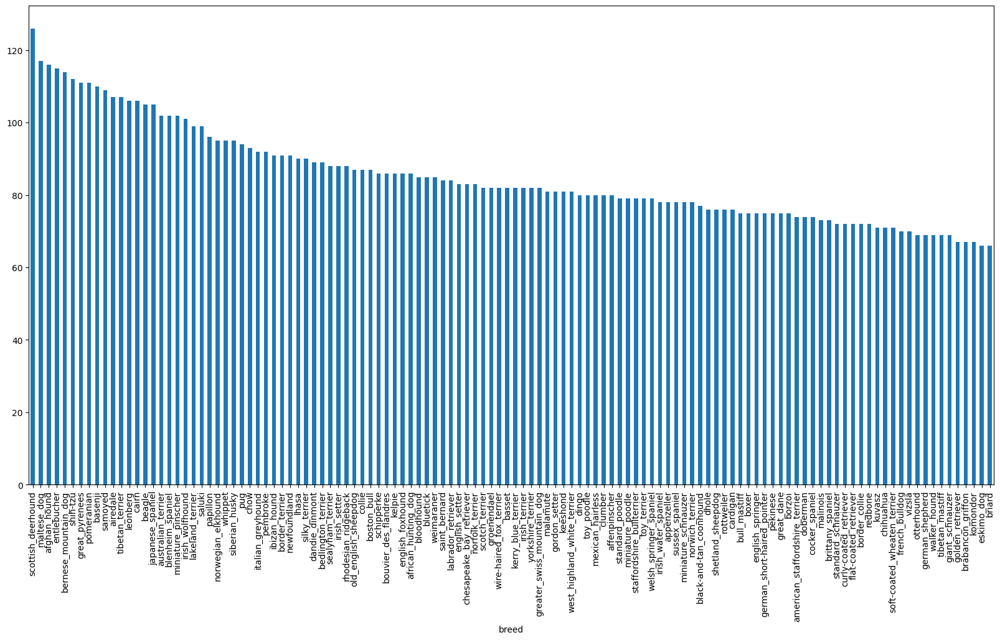

In [3]:
# How many images are there of each breed?
labels_csv['breed'].value_counts().plot.bar(figsize=(20, 10));

In [4]:
# What's the median number of images per class?
labels_csv['breed'].value_counts().median()

82.0

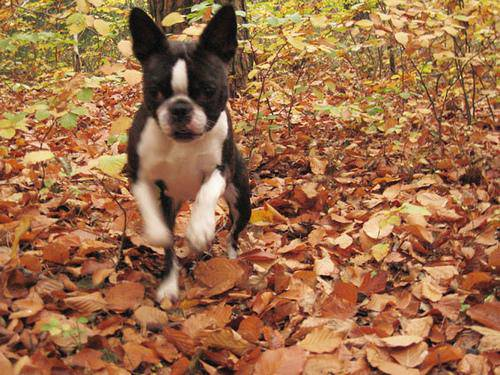

In [5]:
# View an image
from IPython.display import Image
Image('drive/MyDrive/Projects/dog-vision/data/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg')

### Getting images and their labels

Get a list of all images file pathnames.

In [6]:
# Create pathnames from image ID's
filenames = ['drive/MyDrive/Projects/dog-vision/data/dog-breed-identification/train/'+ fname + '.jpg' for fname in labels_csv['id']]

# Check first 10
filenames[:10]

['drive/MyDrive/Projects/dog-vision/data/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Projects/dog-vision/data/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Projects/dog-vision/data/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Projects/dog-vision/data/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Projects/dog-vision/data/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Projects/dog-vision/data/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Projects/dog-vision/data/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Projects/dog-vision/data/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Projects/dog-vision/data/dog-breed-identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 

In [7]:
# Check whether number of filenames matches number of actual images files
import os
if len(os.listdir('drive/MyDrive/Projects/dog-vision/data/dog-breed-identification/train/')) == len(filenames):
  print('Filenames match actual amount of files')
else:
  print('Filenames do not match amount of files')

Filenames match actual amount of files


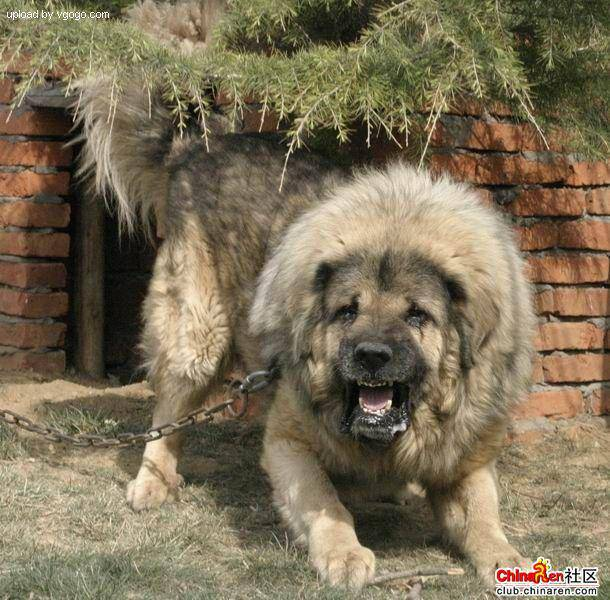

In [8]:
# Final check
Image(filenames[9000])

In [9]:
labels_csv['breed'][9000]

'tibetan_mastiff'

### Prepare labels

In [10]:
import numpy as np
labels = np.array(labels_csv['breed'])
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [11]:
len(labels)

10222

In [12]:
# Check if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print('Labels match actual amount of files')
else:
  print('Labels do not match amount of files')

Labels match actual amount of files


In [13]:
# Find unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [14]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [15]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [16]:
len(boolean_labels)

10222

In [17]:
# Example: Turning array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [18]:
print(labels[10])
print(boolean_labels[10].astype(int))

shetland_sheepdog
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Create validation set

Since the dataset from Kaggle doesn't come with a validation set, one should be created.

In [19]:
# Setup x and y variables
x = filenames
y = boolean_labels

Experiments, to be mindful of time, will be done with ~1000 images and increase as needed.

In [20]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type: 'slider', min: 1000, max: 10000, step: 1000}

In [21]:
# Split data intro train and validation
from sklearn.model_selection import train_test_split

# Split training and validation of total size NUM_IMAGES
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=42)

len(x_train), len(x_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [22]:
x_train[0], y_train[0]

('drive/MyDrive/Projects/dog-vision/data/dog-breed-identification/train/00bee065dcec471f26394855c5c2f3de.jpg',
 array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,  True,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, F

## Preprocessing images into Tensors

To achieve this creating a function adds the possibility to use it everytime that this process needs to be done in the future. Function flow:
1. Take an image filepath as input.
2. Use TensorFlow to read the file and save it to a variable `image`.
3. Turn `image` (jpg) into Tensors.
4. Normalize `image` (convert color channel values from 0-255 to 0-1).
5. Resize the `image` to be a shape of (224, 224).
6. Return the modified `image`.

In [23]:
# Define IMG_SIZE
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  '''
  Takes an image file path and size and returns the resized image as a Tensor.
  '''
  # Read in image file
  image = tf.io.read_file(image_path)
  # Turn the jpg image into numerical Tensor with 3 color channels (RGB)
  image = tf.image.decode_jpeg(image, channels=3)
  # Normalize image
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize image
  image = tf.image.resize(image, size=[img_size, img_size])

  return image

## Turning data into batches

Batches size of 32 for each iteration to make processing fast and don't saturate memory usage.

In [24]:
# Create a function to return a tuple (image, label)
def get_image_label(image_path, label):
  '''
  Takes an image file path name and the assosciated label, processes the image and returns a tuple of (image, label).
  '''
  image = process_image(image_path)

  return image, label

In [25]:
# Demo
(get_image_label(x[42], y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [26]:
# Define batch size (32)
BATCH_SIZE = 32

# Create function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  '''
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle validation data.
  Also accepts test data as input (no labels).
  '''
  if test_data:
    print('Creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  elif valid_data:
    print('Creating validation data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print('Creating training data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))
    data = data.shuffle(buffer_size=len(x))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

In [27]:
# Create training and validation data batches
train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [28]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing data batches

In [29]:
import matplotlib.pyplot as plt

# Create a function for viewving images in a data batch
def show_25_images(images, labels):
  '''
  Displays a plot of 25 images and their label from a data batch.
  '''
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 images
  for i in range(25):
    # Create subplots (5rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display image
    plt.imshow(images[i])
    # Add image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Hide grid lines
    plt.axis('off')

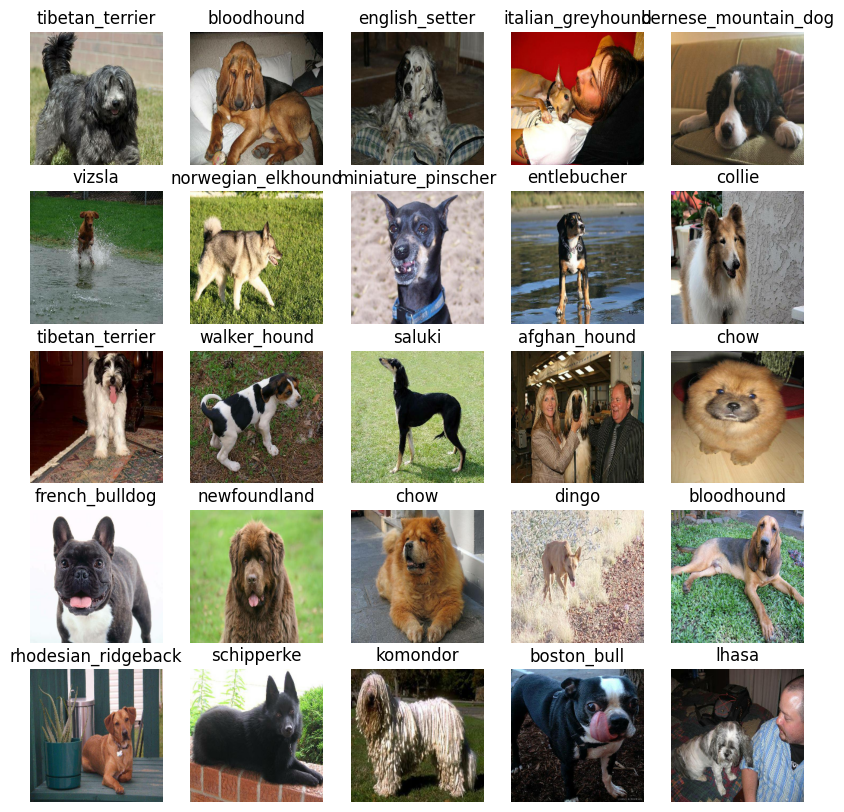

In [30]:
# Visualize data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

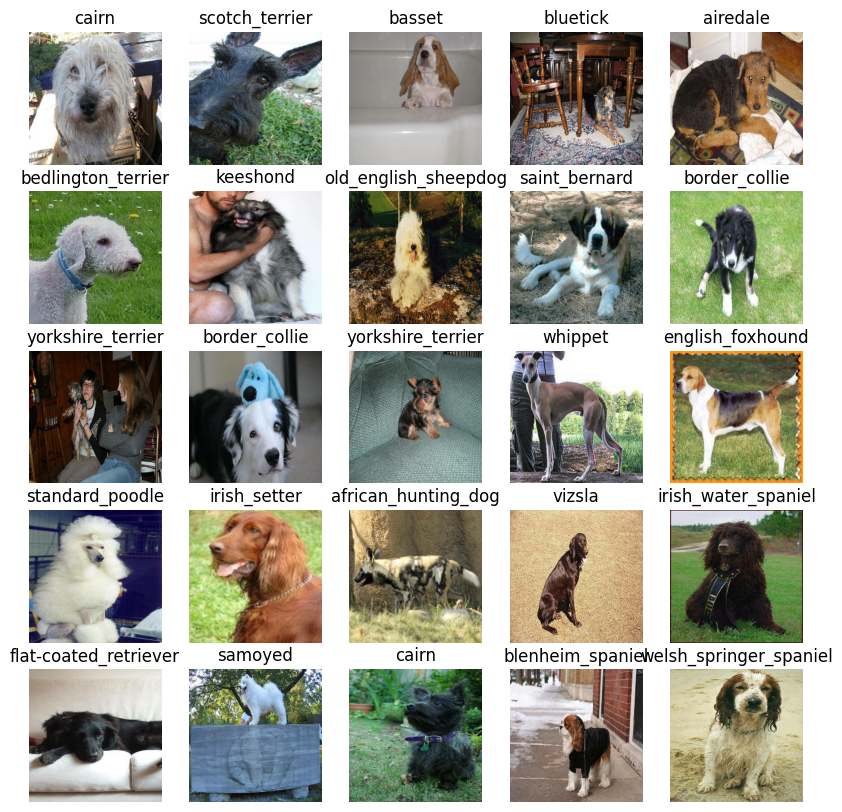

In [31]:
# Visualize data in a validation batch
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Key few things that needs to be defined:
* The input shape (images shape, in the form of Tensors).
* The output shape (image labels, in the form of Tensors).
* The URL of the implemented model.

In [32]:
# Setup input shape
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

# Setup output shape
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/classification/4'

## Keras deep learning model

Create a function which:
* Takes the input shape, output shape and the model URL as parameters.
* Defines the layers in a Keras model sequentially.
* Compiles the model (how it should be evaluated and improved).
* Builds the model.
* Returns the model.

In [33]:
import tf_keras as keras

# Create function to build keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print('Building model with:', model_url)

  # Setup model layers
  model = keras.Sequential([
      hub.KerasLayer(model_url), # Layer 1 (input layer)
      keras.layers.Dense(units=OUTPUT_SHAPE, activation='softmax') # Layer 2 (output layer)
  ])

  # Compile model
  model.compile(
      loss=keras.losses.CategoricalCrossentropy(),
      optimizer=keras.optimizers.Adam(),
      metrics=['accuracy']
  )

  # Build model
  model.build(input_shape)

  return model


In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              3540265   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 3660505 (13.96 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 3540265 (13.51 MB)
_________________________________________________________________


## Create callbacks

Helper functions:
* Check progress (using TendorBoard).
* Stop progress (to prevent overfitting).

In [34]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [35]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create log directory for storing TensorBoard logs
  logdir = os.path.join('drive/MyDrive/Projects/dog-vision/logs', datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))

  return keras.callbacks.TensorBoard(logdir)

In [36]:
# Create early stopping callback
early_stopping = keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3)

### Training model (on a subset of data)

In [37]:
NUM_EPOCHS = 100 #@param {type: 'slider', min: 10, max: 100, step: 10}

In [38]:
# Build function to train model
def train_model():
  '''
  Trains a given model and returns the trained version.
  '''
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit model to the data
  model.fit(x=train_data, epochs=NUM_EPOCHS, validation_data=val_data, validation_freq=1, callbacks=[tensorboard, early_stopping])

  return model

In [41]:
# Fit model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/classification/4
Epoch 1/100
25/25 [==============================] - 125s 5s/step - loss: 4.5234 - accuracy: 0.1175 - val_loss: 3.2722 - val_accuracy: 0.2800
Epoch 2/100
25/25 [==============================] - 40s 2s/step - loss: 1.5064 - accuracy: 0.7113 - val_loss: 1.9559 - val_accuracy: 0.5700
Epoch 3/100
25/25 [==============================] - 37s 1s/step - loss: 0.4848 - accuracy: 0.9488 - val_loss: 1.5489 - val_accuracy: 0.6250
Epoch 4/100
25/25 [==============================] - 39s 2s/step - loss: 0.2246 - accuracy: 0.9850 - val_loss: 1.3852 - val_accuracy: 0.6500
Epoch 5/100
25/25 [==============================] - 38s 2s/step - loss: 0.1295 - accuracy: 0.9975 - val_loss: 1.3142 - val_accuracy: 0.6600
Epoch 6/100
25/25 [==============================] - 36s 1s/step - loss: 0.0899 - accuracy: 0.9987 - val_loss: 1.2760 - val_accuracy: 0.6750
Epoch 7/100
25/25 [==============================] - 40s 2s/

### Cheking the TensorBoard logs



In [39]:
%tensorboard --logdir drive/MyDrive/Projects/dog-vision/logs

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluating predictions using a trained model

In [42]:
# Make preditions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 7s 880ms/step


array([[2.8907617e-03, 1.1521048e-03, 1.2557536e-04, ..., 2.0603738e-04,
        2.1696018e-04, 1.1692896e-03],
       [2.0980298e-04, 3.0630201e-04, 2.6488391e-04, ..., 1.2117460e-05,
        6.8318995e-04, 9.2184206e-07],
       [8.6677474e-06, 1.5553166e-04, 2.1320663e-04, ..., 5.6538440e-04,
        6.2506711e-05, 5.6932066e-03],
       ...,
       [3.2678920e-05, 5.2448857e-05, 1.2099006e-04, ..., 3.1098192e-05,
        2.1928787e-04, 1.3490472e-05],
       [3.0361503e-04, 2.6050952e-06, 2.0902276e-05, ..., 1.1746895e-05,
        1.5322652e-05, 1.2058436e-03],
       [2.6652569e-04, 3.0941266e-04, 6.8121112e-04, ..., 6.4311638e-03,
        1.1639858e-03, 1.4819484e-03]], dtype=float32)

In [43]:
# First prediction
index = 42
print(predictions[index])
print(f'Max value (probability of prediction): {np.max(predictions[index])}')
print(f'Sum: {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Predicted label: {unique_breeds[np.argmax(predictions[index])]}')

[5.98723527e-05 7.65134791e-06 3.86070897e-05 1.28297441e-04
 1.03433081e-03 1.10929241e-05 5.67344614e-05 4.77899943e-04
 4.08096192e-03 7.60747772e-03 4.30570435e-05 5.30344550e-05
 1.75116802e-04 7.41328625e-03 1.00573292e-04 1.56065612e-03
 2.00250270e-05 8.91951640e-05 5.00185241e-04 6.70069630e-06
 3.39595026e-05 2.39130505e-03 1.51682179e-05 5.15704596e-06
 1.68508524e-03 4.83781878e-06 8.53160964e-06 5.24987490e-06
 2.24103438e-04 5.52180700e-06 1.17079298e-05 1.27008709e-04
 8.56393599e-05 6.55289186e-05 1.28415495e-05 4.67263853e-05
 9.93225549e-05 5.86225302e-04 4.28257445e-05 6.03098392e-01
 2.23565396e-04 1.22249303e-05 4.85644583e-03 7.42053180e-06
 2.52394693e-05 1.62569740e-05 2.92414352e-05 9.25168424e-05
 5.22372102e-06 4.32723318e-05 2.53744311e-05 9.25255736e-05
 7.05360027e-04 3.28870519e-04 1.11077770e-05 8.23649345e-04
 6.84187689e-05 1.62731303e-04 8.69492123e-06 1.31382949e-05
 1.47317085e-04 7.17953153e-05 1.20687437e-05 7.49268156e-06
 4.33249406e-05 2.081649

In [44]:
# Turn predition probabilities into their respective label
def get_pred_label(prediction_probabilities):
  '''
  Turn an array of predition probabilities into a label.
  '''
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[9])
pred_label

'collie'

In [45]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [46]:
# Create a function to unbatch a bached dataset
def unbatchify(data):
  '''
  Takes a batched dataset of (image, label) Tensors and retuns separated arrays of imagees and labels.
  '''
  images = []
  labels = []

  # Loop trough unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [47]:
# Create a function to visualize
def plot_pred(prediction_probabilities, labels, images, n=1):
  '''
  View the prediction, ground truth and image for sample n
  '''
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title if the prediction is right or wrong
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'

  # Change plot title
  plt.title('{} {:2.0f}% {}'.format(pred_label, np.max(pred_prob)*100, true_label), color=color)

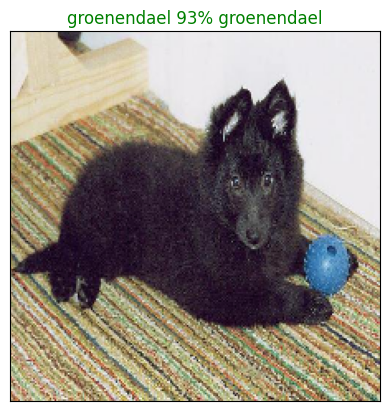

In [48]:
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=77)

## Top 10 predictions

In [49]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  '''
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  '''
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), top_10_pred_values, color='grey')
  plt.xticks(np.arange(len(top_10_pred_labels)), labels=top_10_pred_labels, rotation='vertical')

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else:
    pass

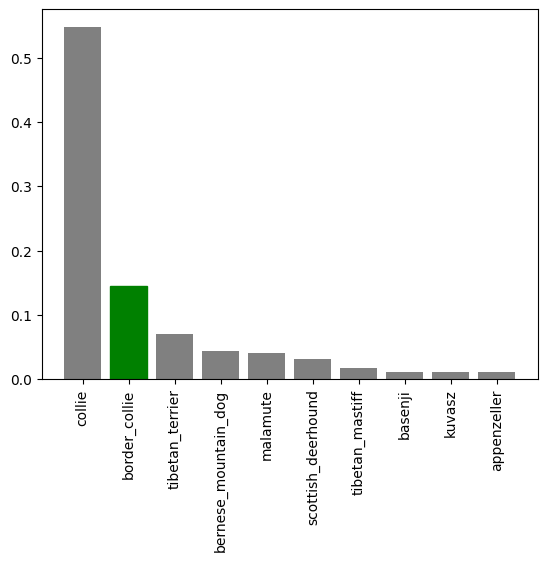

In [50]:
plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, n=9)

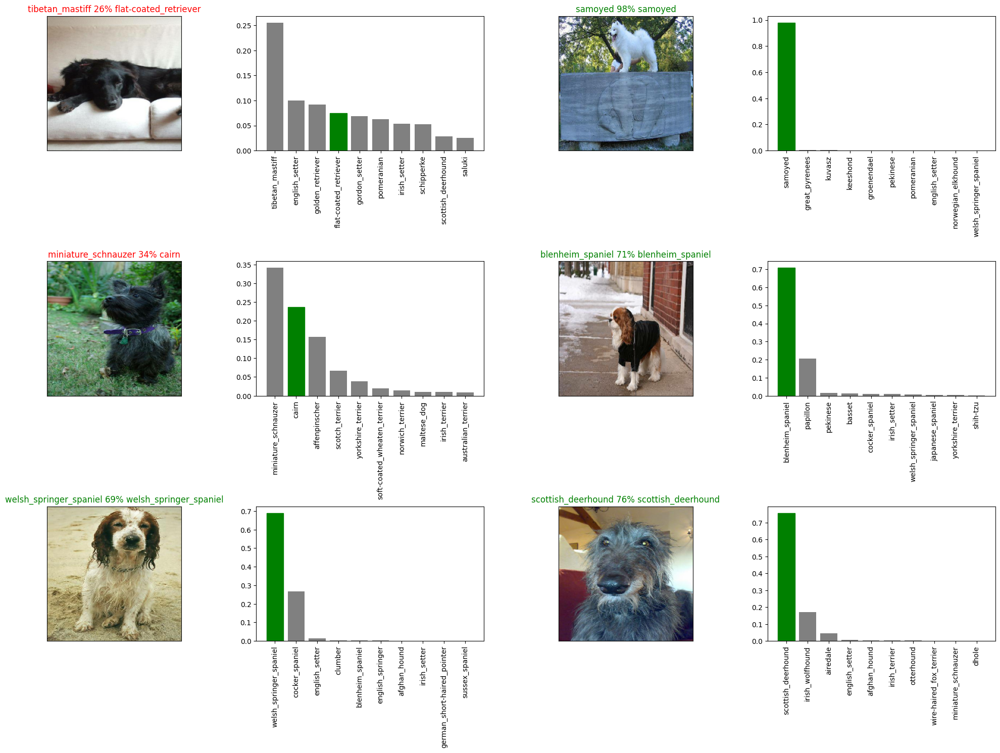

In [51]:
# Check a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, n=i+i_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model

In [52]:
# Create a function to save a model
def save_model(model, suffix=None):
  '''
  Saves a given model in a models directory and appends a suffix (string).
  '''
  # Create a model directory pathname with current time
  modeldir = os.path.join('drive/MyDrive/Projects/dog-vision/models', datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  model_path = modeldir + '-' + suffix + '.h5'
  print(f'Saving model to: {model_path}...')
  model.save(model_path)
  return model_path

In [53]:
# Creat a function to load a trained model
def load_model(model_path):
  '''
  Loads a saved model from a specified path.
  '''
  print(f'Loading a saved model from: {model_path}...')
  model = keras.models.load_model(model_path, custom_objects={'KerasLayer': hub.KerasLayer})

  return model

In [54]:
# Save model trained on 1000 images
save_model(model, suffix='1000-images-mobilenetv2-Adam')

Saving model to: drive/MyDrive/Projects/dog-vision/models/20241011-090927-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Projects/dog-vision/models/20241011-090927-1000-images-mobilenetv2-Adam.h5'

In [55]:
# Load trained model
loaded_1000_image_model = load_model('drive/MyDrive/Projects/dog-vision/models/20241010-174416-1000-images-mobilenetv2-Adam.h5')

Loading a saved model from: drive/MyDrive/Projects/dog-vision/models/20241010-174416-1000-images-mobilenetv2-Adam.h5...


In [56]:
# Evaluate pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 7s 1s/step - loss: 1.1702 - accuracy: 0.6950


[1.1701955795288086, 0.6949999928474426]

In [57]:
# Evaluate loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 7s 837ms/step - loss: 1.2193 - accuracy: 0.6950


[1.2193188667297363, 0.6949999928474426]

## Training model on the full data

In [58]:
len(x), len(y)

(10222, 10222)

In [61]:
# Create a data batch with the full dataset
full_data = create_data_batches(x, y)

Creating training data batches...


In [62]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [63]:
# Create full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/classification/4


In [64]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# Create early stopping callback
full_model_early_stopping = keras.callbacks.EarlyStopping(monitor='accuracy', patience=3)

In [66]:
# Fit the full model to the full data
full_model.fit(x=full_data, epochs=NUM_EPOCHS, callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 1190s 4s/step - loss: 1.2855 - accuracy: 0.6747
Epoch 2/100
320/320 [==============================] - 348s 1s/step - loss: 0.3845 - accuracy: 0.8839
Epoch 3/100
320/320 [==============================] - 372s 1s/step - loss: 0.2215 - accuracy: 0.9388
Epoch 4/100
320/320 [==============================] - 351s 1s/step - loss: 0.1413 - accuracy: 0.9663
Epoch 5/100
320/320 [==============================] - 357s 1s/step - loss: 0.0968 - accuracy: 0.9816
Epoch 6/100
320/320 [==============================] - 353s 1s/step - loss: 0.0721 - accuracy: 0.9869
Epoch 7/100
320/320 [==============================] - 371s 1s/step - loss: 0.0524 - accuracy: 0.9926
Epoch 8/100
320/320 [==============================] - 345s 1s/step - loss: 0.0421 - accuracy: 0.9950
Epoch 9/100
320/320 [==============================] - 357s 1s/step - loss: 0.0335 - accuracy: 0.9967
Epoch 10/100
320/320 [==============================] - 397s 1s/step - loss: 0.02

In [67]:
save_model(full_model, suffix='full-image-set-mobilenetv2-Adam')

Saving model to: drive/MyDrive/Projects/dog-vision/models/20241011-112230-full-image-set-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Projects/dog-vision/models/20241011-112230-full-image-set-mobilenetv2-Adam.h5'

In [68]:
loaded_full_model = load_model('drive/MyDrive/Projects/dog-vision/models/20241011-112230-full-image-set-mobilenetv2-Adam.h5')

Loading a saved model from: drive/MyDrive/Projects/dog-vision/models/20241011-112230-full-image-set-mobilenetv2-Adam.h5...


## Predictions on the test dataset

Formating test data is needed to match training format before running tests.

In [69]:
# Load test image filesnames
test_path = 'drive/MyDrive/Projects/dog-vision/data/dog-breed-identification/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Projects/dog-vision/data/dog-breed-identification/test/e431adb273c1b705e6e85147990f355e.jpg',
 'drive/MyDrive/Projects/dog-vision/data/dog-breed-identification/test/dcbe4226672aa4af80c1e52a9bb78268.jpg',
 'drive/MyDrive/Projects/dog-vision/data/dog-breed-identification/test/dfc0659b3b6eff35dc50d2501f1ea247.jpg',
 'drive/MyDrive/Projects/dog-vision/data/dog-breed-identification/test/dcfd3463e1d23d51b309b0385292870b.jpg',
 'drive/MyDrive/Projects/dog-vision/data/dog-breed-identification/test/e752d87634c6177a748d655a55aeec89.jpg',
 'drive/MyDrive/Projects/dog-vision/data/dog-breed-identification/test/e3baf6b2914677edd2729db0f32e2620.jpg',
 'drive/MyDrive/Projects/dog-vision/data/dog-breed-identification/test/e021107c3f07749e5f5b389e57e21ded.jpg',
 'drive/MyDrive/Projects/dog-vision/data/dog-breed-identification/test/e1c6c50bbaee219e7faf29e9c1c343ca.jpg',
 'drive/MyDrive/Projects/dog-vision/data/dog-breed-identification/test/e5b8269cbd9b417dd00e8661206b91ff.jpg',
 'drive/My

In [70]:
len(test_filenames)

10357

In [71]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [72]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [73]:
# Make predictions on test data batch using full model
test_predictions = loaded_full_model.predict(test_data, verbose=1)

324/324 [==============================] - 1344s 4s/step


In [74]:
# Save predictions (NumPy array) to csv file
np.savetxt('drive/MyDrive/Projects/dog-vision/preds_array.csv', test_predictions, delimiter=',')

In [75]:
# Load predictions from csv file
test_predictions = np.loadtxt('drive/MyDrive/Projects/dog-vision/preds_array.csv', delimiter=',')

In [76]:
test_predictions[:10]

array([[3.66985553e-08, 2.52732804e-08, 1.00859543e-08, ...,
        1.06359943e-09, 1.04952924e-09, 4.12356121e-06],
       [3.00370107e-09, 1.85923235e-10, 1.08396115e-07, ...,
        4.16795586e-07, 1.67732193e-08, 1.89384693e-07],
       [1.00573576e-08, 2.23346297e-09, 3.43049294e-07, ...,
        2.44306317e-08, 1.48266656e-04, 6.47895513e-06],
       ...,
       [4.61614907e-01, 3.46106782e-10, 1.50629745e-10, ...,
        5.78764758e-10, 2.17547265e-11, 1.96181509e-06],
       [1.85181193e-09, 6.61713329e-07, 5.34766953e-11, ...,
        2.53527732e-09, 2.89259527e-09, 1.88584669e-11],
       [1.25337172e-08, 1.39323770e-08, 2.53038870e-08, ...,
        1.03419351e-09, 5.44367398e-11, 6.69553728e-08]])

In [77]:
test_predictions.shape

(10357, 120)

## Formating test dataset predictions for Kaggle

www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

In [78]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=['id'] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [85]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df['id'] = test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e431adb273c1b705e6e85147990f355e,3.669856e-08,2.527328e-08,1.008595e-08,2.373624e-09,4.395538e-07,3.446253e-09,6.470644e-08,3.771845e-09,5.825151e-11,...,7.480374e-06,3.269398e-10,4.017421e-09,2.135627e-09,8.862115e-09,3.051202e-09,2.545904e-06,1.063599e-09,1.049529e-09,4.123561e-06
1,dcbe4226672aa4af80c1e52a9bb78268,3.003701e-09,1.859232e-10,1.083961e-07,2.460242e-10,1.040465e-07,5.606071e-08,6.948213e-11,3.948366e-07,1.282605e-09,...,7.368046e-11,9.103497e-05,5.464507e-09,9.333659e-08,6.524949e-08,2.136362e-10,1.590849e-08,4.167956e-07,1.677322e-08,1.893847e-07
2,dfc0659b3b6eff35dc50d2501f1ea247,1.005736e-08,2.233463e-09,3.430493e-07,1.520132e-02,1.521056e-01,9.395192e-05,3.675749e-05,4.658410e-05,1.048266e-09,...,2.070644e-10,6.011640e-06,1.512480e-09,3.006630e-08,9.112689e-09,8.038908e-07,3.884298e-08,2.443063e-08,1.482667e-04,6.478955e-06
3,dcfd3463e1d23d51b309b0385292870b,2.542582e-12,9.999890e-01,2.766882e-12,5.448486e-11,9.838328e-15,1.059886e-11,2.573156e-12,1.189369e-13,8.825166e-14,...,6.066371e-13,3.092016e-14,1.083198e-12,1.120274e-11,3.349906e-13,2.415345e-11,6.772083e-13,7.458676e-13,1.255520e-10,1.110609e-11
4,e752d87634c6177a748d655a55aeec89,1.831362e-06,7.376138e-08,3.473724e-08,5.734917e-09,8.585275e-08,5.471918e-06,7.364682e-06,9.072923e-09,4.485275e-07,...,4.038192e-06,1.899034e-08,1.058069e-06,3.111230e-09,1.294006e-07,2.062960e-07,7.089828e-05,1.864735e-08,4.604876e-07,5.030508e-06


In [84]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e431adb273c1b705e6e85147990f355e,3.669856e-08,2.527328e-08,1.008595e-08,2.373624e-09,4.395538e-07,3.446253e-09,6.470644e-08,3.771845e-09,5.825151e-11,...,7.480374e-06,3.269398e-10,4.017421e-09,2.135627e-09,8.862115e-09,3.051202e-09,2.545904e-06,1.063599e-09,1.049529e-09,4.123561e-06
1,dcbe4226672aa4af80c1e52a9bb78268,3.003701e-09,1.859232e-10,1.083961e-07,2.460242e-10,1.040465e-07,5.606071e-08,6.948213e-11,3.948366e-07,1.282605e-09,...,7.368046e-11,9.103497e-05,5.464507e-09,9.333659e-08,6.524949e-08,2.136362e-10,1.590849e-08,4.167956e-07,1.677322e-08,1.893847e-07
2,dfc0659b3b6eff35dc50d2501f1ea247,1.005736e-08,2.233463e-09,3.430493e-07,1.520132e-02,1.521056e-01,9.395192e-05,3.675749e-05,4.658410e-05,1.048266e-09,...,2.070644e-10,6.011640e-06,1.512480e-09,3.006630e-08,9.112689e-09,8.038908e-07,3.884298e-08,2.443063e-08,1.482667e-04,6.478955e-06
3,dcfd3463e1d23d51b309b0385292870b,2.542582e-12,9.999890e-01,2.766882e-12,5.448486e-11,9.838328e-15,1.059886e-11,2.573156e-12,1.189369e-13,8.825166e-14,...,6.066371e-13,3.092016e-14,1.083198e-12,1.120274e-11,3.349906e-13,2.415345e-11,6.772083e-13,7.458676e-13,1.255520e-10,1.110609e-11
4,e752d87634c6177a748d655a55aeec89,1.831362e-06,7.376138e-08,3.473724e-08,5.734917e-09,8.585275e-08,5.471918e-06,7.364682e-06,9.072923e-09,4.485275e-07,...,4.038192e-06,1.899034e-08,1.058069e-06,3.111230e-09,1.294006e-07,2.062960e-07,7.089828e-05,1.864735e-08,4.604876e-07,5.030508e-06


In [86]:
# Save predictions dataframe to csv
preds_df.to_csv('drive/MyDrive/Projects/dog-vision/full_model_predictions_submission.csv', index=False)

## Making predictions on custom images

In [87]:
# Get custom images filepaths
custom_path = 'drive/MyDrive/Projects/dog-vision/data/dog-breed-identification/custom_images/'
custom_images_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [88]:
custom_images_paths

['drive/MyDrive/Projects/dog-vision/data/dog-breed-identification/custom_images/dog-2.jpg',
 'drive/MyDrive/Projects/dog-vision/data/dog-breed-identification/custom_images/dog-6.jpg',
 'drive/MyDrive/Projects/dog-vision/data/dog-breed-identification/custom_images/dog-5.jpg',
 'drive/MyDrive/Projects/dog-vision/data/dog-breed-identification/custom_images/dog-4.jpg',
 'drive/MyDrive/Projects/dog-vision/data/dog-breed-identification/custom_images/dog-1.jpg',
 'drive/MyDrive/Projects/dog-vision/data/dog-breed-identification/custom_images/dog-3.jpg']

In [89]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_images_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [96]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 2s 2s/step


In [97]:
custom_preds.shape

(6, 120)

In [99]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['cocker_spaniel',
 'soft-coated_wheaten_terrier',
 'golden_retriever',
 'border_collie',
 'irish_terrier',
 'pug']

In [100]:
# Get custom images
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

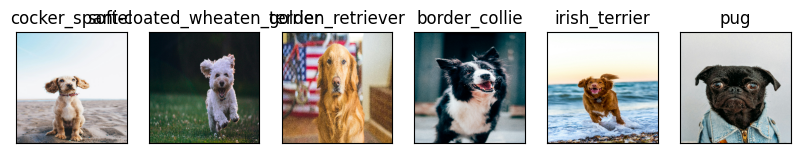

In [112]:
# Check custom images predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 6, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)